In [1]:
import matplotlib.pyplot as plt
import nltk
import pandas as pd
import re
import seaborn as sns
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from wordcloud import WordCloud

nltk.download("punkt_tab")
nltk.download("stopwords")
nltk.download("wordnet")

sns.set_theme()

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\sosno\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sosno\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\sosno\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


# Первый взгляд на набор данных

In [2]:
(books := pd.read_csv("data.csv"))

,index,title,genre,summary
0,0,Drowned Wednesday,fantasy,Drowned Wednesday is the first Trustee among ...
1,1,The Lost Hero,fantasy,"As the book opens, Jason awakens on a school ..."
2,2,The Eyes of the Overworld,fantasy,Cugel is easily persuaded by the merchant Fia...
3,3,Magic's Promise,fantasy,The book opens with Herald-Mage Vanyel return...
4,4,Taran Wanderer,fantasy,Taran and Gurgi have returned to Caer Dallben...
...,...,...,...,...
4652,4652,Hounded,fantasy,"Atticus O’Sullivan, last of the Druids, lives ..."
4653,4653,Charlie and the Chocolate Factory,fantasy,Charlie Bucket's wonderful adventure begins wh...
4654,4654,Red Rising,fantasy,"""I live for the dream that my children will be..."
4655,4655,Frostbite,fantasy,"Rose loves Dimitri, Dimitri might love Tasha, ..."


In [3]:
(books := books.iloc[:, [0, 1, 3, 2]])

,index,title,summary,genre
0,0,Drowned Wednesday,Drowned Wednesday is the first Trustee among ...,fantasy
1,1,The Lost Hero,"As the book opens, Jason awakens on a school ...",fantasy
2,2,The Eyes of the Overworld,Cugel is easily persuaded by the merchant Fia...,fantasy
3,3,Magic's Promise,The book opens with Herald-Mage Vanyel return...,fantasy
4,4,Taran Wanderer,Taran and Gurgi have returned to Caer Dallben...,fantasy
...,...,...,...,...
4652,4652,Hounded,"Atticus O’Sullivan, last of the Druids, lives ...",fantasy
4653,4653,Charlie and the Chocolate Factory,Charlie Bucket's wonderful adventure begins wh...,fantasy
4654,4654,Red Rising,"""I live for the dream that my children will be...",fantasy
4655,4655,Frostbite,"Rose loves Dimitri, Dimitri might love Tasha, ...",fantasy


In [4]:
books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4657 entries, 0 to 4656
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   index    4657 non-null   int64 
 1   title    4657 non-null   object
 2   summary  4657 non-null   object
 3   genre    4657 non-null   object
dtypes: int64(1), object(3)
memory usage: 145.7+ KB


In [5]:
books.astype(str).describe()

,index,title,summary,genre
count,4657,4657,4657,4657
unique,4657,4296,4542,10
top,4656,Bloodline,The incredible true story of the women who fou...,thriller
freq,1,4,3,1023


# Удаление дупликатов

In [6]:
books = books.drop(columns="index")
books[books.duplicated(keep=False)].sort_values("title")

,title,summary,genre
3608,A Lie for a Lie,From the New York Times bestselling author of ...,sports
3624,A Lie for a Lie,From the New York Times bestselling author of ...,sports
3632,Changing the Game,Sports agent Liz Darnell will do anything to w...,sports
3616,Changing the Game,Sports agent Liz Darnell will do anything to w...,sports
3637,Garrett,Carolina Cold Fury star Garrett Samuelson neve...,sports
3621,Garrett,Carolina Cold Fury star Garrett Samuelson neve...,sports
3629,Hands Down,"Before he was Big Texas, he was Zac the Snack ...",sports
3613,Hands Down,"Before he was Big Texas, he was Zac the Snack ...",sports
3635,Jock Row,Scarlett is always the sensible one: The sober...,sports
3619,Jock Row,Scarlett is always the sensible one: The sober...,sports


In [7]:
books.drop_duplicates(inplace=True)
books.reset_index(drop=True, inplace=True)
books.describe()

,title,summary,genre
count,4640,4640,4640
unique,4296,4542,10
top,Bloodline,"Could you survive on your own in the wild, wit...",thriller
freq,4,3,1023


# Разведочный анализ данных

## Одинаковые названия и краткие содержания книг

In [8]:
books_freq = books.copy()
books_freq["title_freq"] = books.title.map(books.title.value_counts())
books_freq["summary_freq"] = books.summary.map(books.summary.value_counts())
(books_freq := books_freq[(books_freq.title_freq > 1) | (books_freq.summary_freq > 1)])

,title,summary,genre,title_freq,summary_freq
1,The Lost Hero,"As the book opens, Jason awakens on a school ...",fantasy,2,1
13,The Woman Who Rides Like a Man,The third book sees Alanna through her journe...,fantasy,2,1
41,Small Gods,The Great God Om tries to manifest himself on...,fantasy,2,1
44,The Mists of Avalon,Mists of Avalon is a generations-spanning ret...,fantasy,2,1
46,A Feast for Crows,The War of the Five Kings is slowly coming to...,fantasy,2,1
...,...,...,...,...,...
4581,The Alchemist,"Combining magic, mysticism, wisdom and wonder ...",fantasy,2,1
4587,The Goose Girl,She was born with her eyes closed and a word o...,fantasy,2,1
4599,The Phantom Tollbooth,Librarian's Note: For an alternate cover editi...,fantasy,2,1
4621,Perdido Street Station,"Beneath the towering bleached ribs of a dead, ...",fantasy,2,1


In [9]:
books_title_freq = books_freq[books_freq.title_freq > 1].sort_values(["title_freq", "title"])
books_title_freq.head(20)

,title,summary,genre,title_freq,summary_freq
1237,1st to Die,The prologue introduces main character Inspec...,crime,2,1
3754,1st to Die,Four crime-solving friends face off against a ...,thriller,2,1
827,2001: A Space Odyssey,"In the background to the story in the book, a...",science,2,1
3520,2001: A Space Odyssey,"On the Moon, an enigma is uncovered.\n\nSo gre...",science,2,1
1295,2nd Chance,Homicide Lieutenant Lindsay Boxer is still re...,crime,2,1
4021,2nd Chance,The Women's Murder Club returns for another th...,thriller,2,1
1385,3rd Degree,In this installment after a house with a fami...,crime,2,1
4159,3rd Degree,The Women's Murder Club returns in a shockingl...,thriller,2,1
2523,61 Hours,"Set in the town of Bolton, South Dakota, Reac...",thriller,2,1
3727,61 Hours,Jack Reacher is back.\nThe countdown has begun...,thriller,2,1


In [10]:
books_title_freq.tail(21)

,title,summary,genre,title_freq,summary_freq
2321,Twilight,"Isabella ""Bella"" Swan moves from sunny Phoeni...",horror,3,1
3301,Twilight,About three things I was absolutely positive.\...,romance,3,2
4291,Twilight,About three things I was absolutely positive.\...,fantasy,3,2
2074,Vampire Academy,"Guardian in training Rosemarie ""Rose"" Hathawa...",horror,3,1
3368,Vampire Academy,Only a true best friend can protect you from y...,romance,3,2
4440,Vampire Academy,Only a true best friend can protect you from y...,fantasy,3,2
2414,Watchers,"The story begins in Santa Barbara, California...",horror,3,1
3172,Watchers,They escape from a secret government: two muta...,horror,3,2
3780,Watchers,They escape from a secret government: two muta...,thriller,3,2
2032,Bloodline,The novel begins a bit after Gia and Vicky re...,horror,4,1


In [11]:
books_summary_freq = books_freq[books_freq.summary_freq > 1].sort_values(["summary_freq", "summary"])
books_summary_freq.head(20)

,title,summary,genre,title_freq,summary_freq
338,The Caverns of Kalte,==Receptio,fantasy,1,2
1574,Guardians of Ga'Hoole Book 4: The Siege,==Receptio,history,1,2
2633,Nothing to Lose,As described by Sherryl Connelly of the New Y...,thriller,1,2
2936,Conviction,As described by Sherryl Connelly of the New Y...,thriller,1,2
3001,"Guns, Germs, and Steel: The Fates of Human Soc...","""Diamond has written a book of remarkable scop...",history,2,2
3428,"Guns, Germs, and Steel: The Fates of Human Soc...","""Diamond has written a book of remarkable scop...",science,2,2
3121,"Full Dark, No Stars","""I believe there is another man inside every m...",horror,2,2
4063,"Full Dark, No Stars","""I believe there is another man inside every m...",thriller,2,2
3000,Sapiens: A Brief History of Humankind,"100,000 years ago, at least six human species ...",history,2,2
3415,Sapiens: A Brief History of Humankind,"100,000 years ago, at least six human species ...",science,2,2


In [12]:
books_summary_freq.tail(21)

,title,summary,genre,title_freq,summary_freq
3324,City of Bones,When fifteen-year-old Clary Fray heads out to ...,romance,2,2
4289,City of Bones,When fifteen-year-old Clary Fray heads out to ...,fantasy,2,2
3265,Freakonomics: A Rogue Economist Explores the H...,"Which is more dangerous, a gun or a swimming p...",psychology,2,2
3477,Freakonomics: A Rogue Economist Explores the H...,"Which is more dangerous, a gun or a swimming p...",science,2,2
3348,Gone Girl,Who are you?\nWhat have we done to each other?...,romance,2,2
3641,Gone Girl,Who are you?\nWhat have we done to each other?...,thriller,2,2
3243,Behave: The Biology of Humans at Our Best and ...,Why do we do the things we do?\n\nMore than a ...,psychology,2,2
3461,Behave: The Biology of Humans at Our Best and ...,Why do we do the things we do?\n\nMore than a ...,science,2,2
3272,Musicophilia: Tales of Music and the Brain,With the same trademark compassion and eruditi...,psychology,2,2
3500,Musicophilia: Tales of Music and the Brain,With the same trademark compassion and eruditi...,science,2,2


## Длина названий и кратких содержаний книг

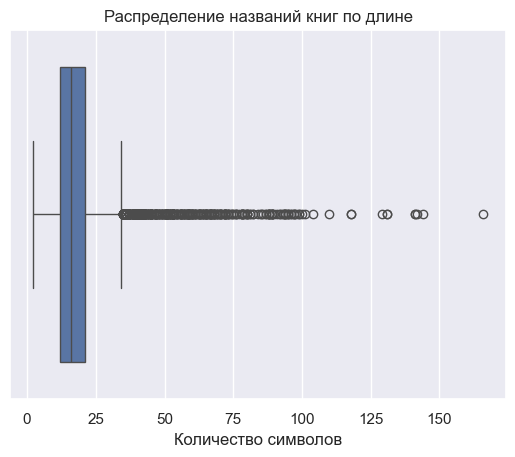

In [13]:
title_len = books.title.apply(lambda t: len(t))
sns.boxplot(x=title_len).set(
    title="Распределение названий книг по длине", xlabel="Количество символов", ylabel=""
);

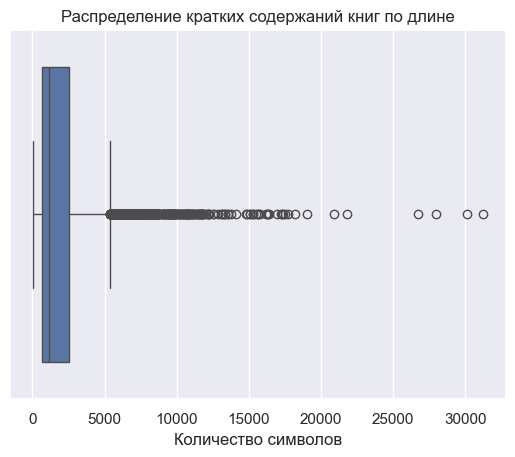

In [14]:
summary_len = books.summary.apply(lambda s: len(s))
sns.boxplot(x=summary_len).set(
    title="Распределение кратких содержаний книг по длине", xlabel="Количество символов", ylabel=""
);

In [15]:
books_len = books.copy()
books_len["title_len"] = title_len.values
books_len["summary_len"] = summary_len.values
books_len

,title,summary,genre,title_len,summary_len
0,Drowned Wednesday,Drowned Wednesday is the first Trustee among ...,fantasy,17,4704
1,The Lost Hero,"As the book opens, Jason awakens on a school ...",fantasy,13,3127
2,The Eyes of the Overworld,Cugel is easily persuaded by the merchant Fia...,fantasy,25,1953
3,Magic's Promise,The book opens with Herald-Mage Vanyel return...,fantasy,15,4598
4,Taran Wanderer,Taran and Gurgi have returned to Caer Dallben...,fantasy,14,6743
...,...,...,...,...,...
4635,Hounded,"Atticus O’Sullivan, last of the Druids, lives ...",fantasy,7,890
4636,Charlie and the Chocolate Factory,Charlie Bucket's wonderful adventure begins wh...,fantasy,33,249
4637,Red Rising,"""I live for the dream that my children will be...",fantasy,10,1371
4638,Frostbite,"Rose loves Dimitri, Dimitri might love Tasha, ...",fantasy,9,983


In [16]:
books_title_len = books_len.sort_values(["title_len", "title"])
books_title_len.title.head(10).to_list()

['48', 'It', 'It', 'Us', '334', 'Air', 'Bec', 'Bro', 'Eon', 'Hex']

In [17]:
books_title_len.title.tail(10).to_list()

["The Ghost Map: The Story of London's Most Terrifying Epidemic—and How It Changed Science, Cities, and the Modern World",
 "The Ghost Map: The Story of London's Most Terrifying Epidemic—and How It Changed Science, Cities, and the Modern World",
 "How the Irish Saved Civilization: The Untold Story of Ireland's Heroic Role from the Fall of Rome to the Rise of Medieval Europe ",
 'Empire of the Summer Moon: Quanah Parker and the Rise and Fall of the Comanches, the Most Powerful Indian Tribe in American History',
 'The Disappearing Spoon: And Other True Tales of Madness, Love, and the History of the World from the Periodic Table of the Elements',
 'How to Change Your Mind: What the New Science of Psychedelics Teaches Us About Consciousness, Dying, Addiction, Depression, and Transcendence',
 'How to Change Your Mind: What the New Science of Psychedelics Teaches Us About Consciousness, Dying, Addiction, Depression, and Transcendence',
 "You Are Not So Smart: Why You Have Too Many Friends on

In [18]:
books_summary_len = books_len.sort_values(["summary_len", "summary"])
books_summary_len.summary.head(10).to_list()

[' ==Receptio',
 ' ==Receptio',
 ' ==Character',
 '- --&#62; &#60;!-',
 ' ~Plot outline description',
 '- ~Plot outline description',
 ' ~Plot outline description~ -->',
 ' ~Plot outline description~ --> <!--',
 ' The novel tackles themes of terrorism.',
 ' Archform: Beauty is set in 24th century Earth.']

In [19]:
books_summary_len.summary.tail(10).to_list()

[' There are two strands: *the conspiracy against the Warden of Outland, instigated by the Sub-Warden and Chancellor, and *the love of a young doctor, Arthur, for Lady Muriel ;Chapter 1: The narrator finds himself in a high room overlooking a public square filled with people. The room is the Warden\'s breakfast-saloon. The Chancellor has organised a "spontaneous" demonstration (by a rent-a-mob which seems to be confused about whether to chant "More bread, less taxes" or "Less bread, more taxes"). Bruno enters briefly, looking for Sylvie. The Chancellor delivers a speech. The narrator follows Bruno into the study, where he climbs on to the Warden\'s knee, next to Sylvie. The Warden tells them that the Professor has finally returned from his long wanderings in search of health. They set off for the Library, where the Professor tells them about his concerns with the barometer and with "horizontal weather". The Professor then leads the children back to the saloon. ;Chapter 2: The narrator 

## Распределение книг по жанрам

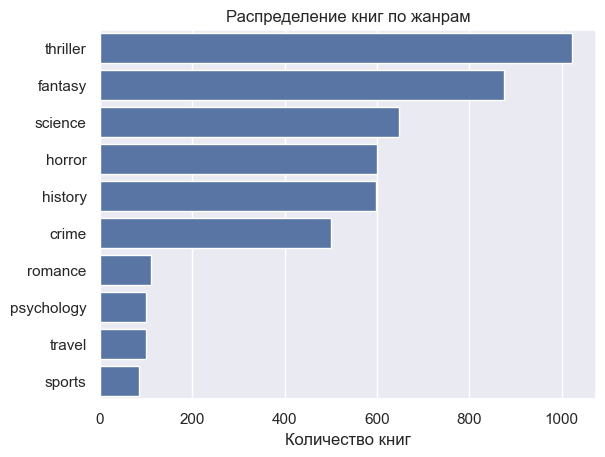

In [20]:
genre_counts = books.genre.value_counts()
sns.barplot(x=genre_counts.values, y=genre_counts.index).set(
    title="Распределение книг по жанрам", xlabel="Количество книг", ylabel=""
);

# Предобработка названий и кратких содержаний книг

In [21]:
stop_words = set(stopwords.words("english"))
lemmatizer = WordNetLemmatizer()

In [22]:
def normalize_text(text):
    text = text.lower()
    
    text = re.sub(r"<.*?>", " ", text)
    text = re.sub(r"[^a-z]+", " ", text)
    
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word not in stop_words]
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    tokens = [word for word in tokens if len(word) > 1]
    
    result = " ".join(tokens)
    result = re.sub(r"\s+", " ", result).strip()
    
    return result

In [23]:
books_new = books.copy()
books_new.title = books_new.title.apply(normalize_text)
books_new.summary = books_new.summary.apply(normalize_text)
books_new

,title,summary,genre
0,drowned wednesday,drowned wednesday first trustee among morrow d...,fantasy
1,lost hero,book open jason awakens school bus unable reme...,fantasy
2,eye overworld,cugel easily persuaded merchant fianosther att...,fantasy
3,magic promise,book open herald mage vanyel returning country...,fantasy
4,taran wanderer,taran gurgi returned caer dallben following ev...,fantasy
...,...,...,...
4635,hounded,atticus sullivan last druid life peacefully ar...,fantasy
4636,charlie chocolate factory,charlie bucket wonderful adventure begin find ...,fantasy
4637,red rising,live dream child born free say like land fathe...,fantasy
4638,frostbite,rose love dimitri dimitri might love tasha mas...,fantasy


# Векторизация названий книг

## Создание мешков слов

In [24]:
title_count_vec = CountVectorizer()
title_count_csr = title_count_vec.fit_transform(books_new.title)
(title_counts := pd.Series(
    title_count_csr.sum(axis=0).A1.tolist(),
    title_count_vec.get_feature_names_out()
).sort_values(ascending=False))

world      75
girl       62
dark       57
death      57
man        55
           ..
yankee      1
yangtze     1
xone        1
wyrms       1
wyld        1
Length: 4103, dtype: int64

In [25]:
title_tfidf_vec = TfidfVectorizer()
title_tfidf_csr = title_tfidf_vec.fit_transform(books_new.title)
(title_tfidfs := pd.Series(
    title_tfidf_csr.sum(axis=0).A1.tolist(),
    title_tfidf_vec.get_feature_names_out()
).sort_values(ascending=False))

girl           31.467528
death          29.671260
dark           29.286398
world          28.232908
man            26.844860
                 ...    
attempt         0.273320
mystifying      0.273320
comfortable     0.273320
eating          0.273320
squid           0.273320
Length: 4103, dtype: float64

## Облака слов на основе мешков слов

In [26]:
def get_words_freq_by_column(df, column, csr, feature_names):
    words_freq_by_column = {}

    for value in df[column].unique():
        column_books = df[df[column] == value]
        column_vector = csr[column_books.index].sum(axis=0).A1

        column_words_freq = pd.Series(column_vector, index=feature_names)
        column_words_freq = column_words_freq[column_words_freq > 0]

        words_freq_by_column[value] = column_words_freq

    return words_freq_by_column


def get_wordcloud(words_freq, ax, title=""):
    cloud = WordCloud(
        width=1000, height=500, random_state=0, background_color="white"
    ).generate_from_frequencies(words_freq)
    ax.set_title(title, fontsize=16, fontweight="bold")  
    ax.axis("off")
    ax.imshow(cloud)


def get_wordclouds_by_column(df, column, words_freq_by_column, title_template, sort_index=False):
    _, axes = plt.subplots(nrows=5, ncols=2, figsize=(12, 16))
    axes = axes.flatten()

    value_counts = df[column].value_counts()
    if sort_index:
        value_counts.sort_index(inplace=True)

    for i, value, value_cnt in zip(
        range(len(axes)),
        value_counts.index,
        value_counts.values
    ):
        get_wordcloud(
            words_freq_by_column[value],
            ax=axes[i],
            title=title_template.format(value=value, value_cnt=value_cnt)
        )

    plt.tight_layout()


genre_title_template = "{value} ({value_cnt} книг)"

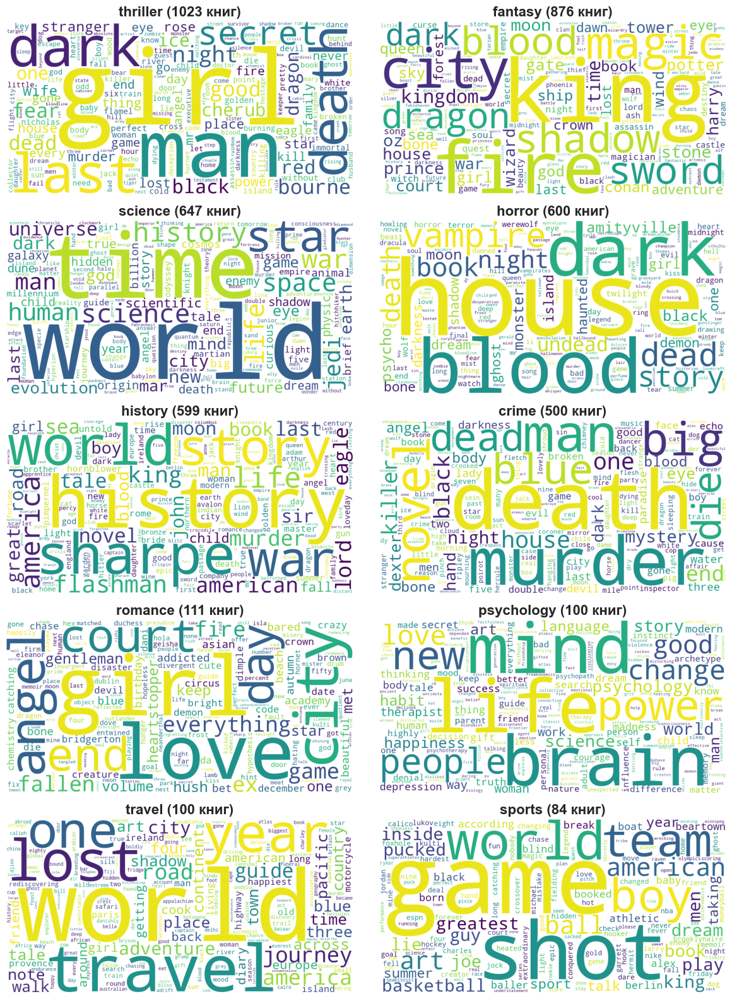

In [27]:
title_count_by_genre = get_words_freq_by_column(
    df=books_new,
    column="genre",
    csr=title_count_csr,
    feature_names=title_count_vec.get_feature_names_out()
)
get_wordclouds_by_column(
    df=books_new,
    column="genre",
    words_freq_by_column=title_count_by_genre,
    title_template=genre_title_template
)

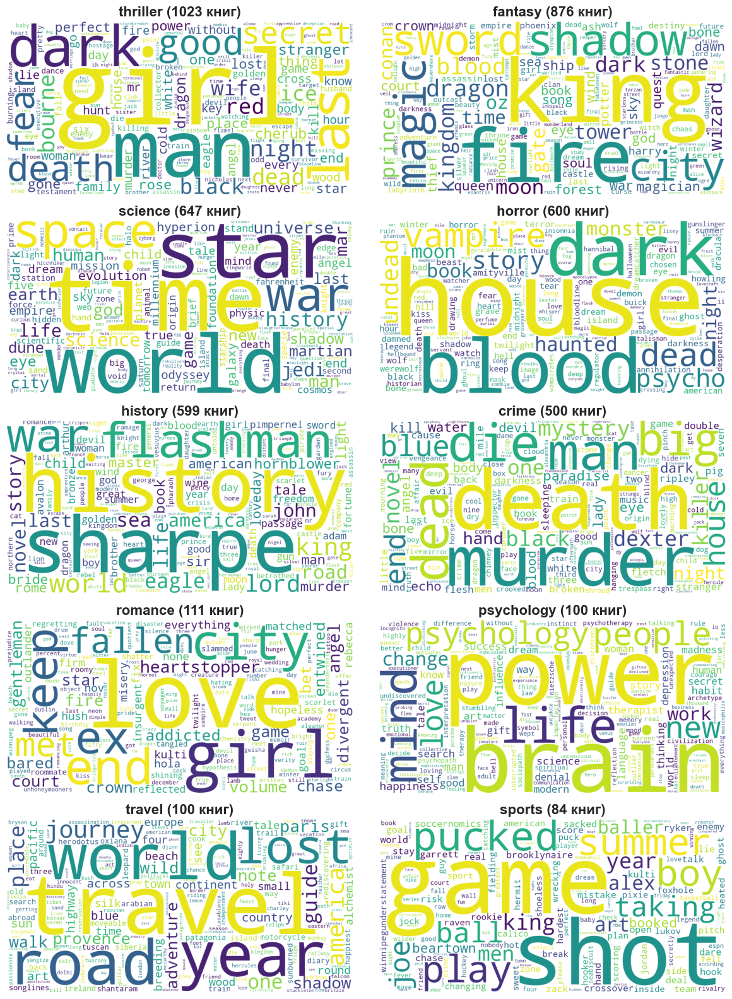

In [28]:
title_tfidf_by_genre = get_words_freq_by_column(
    df=books_new,
    column="genre",
    csr=title_tfidf_csr,
    feature_names=title_tfidf_vec.get_feature_names_out()
)
get_wordclouds_by_column(
    df=books_new,
    column="genre",
    words_freq_by_column=title_tfidf_by_genre,
    title_template=genre_title_template
)

## Визуализация распределения книг на плоскости

In [29]:
def get_scatter_plot(X_pca, hue=None, palette="Paired", ax=None, figsize=(10, 8), title=""):
    if figsize:
        plt.figure(figsize=figsize)
    return sns.scatterplot(
        x=X_pca[:, 0], y=X_pca[:, 1], hue=hue, palette=palette, ax=ax
    ).set(
        title=title, xticks=[], yticks=[]
    )

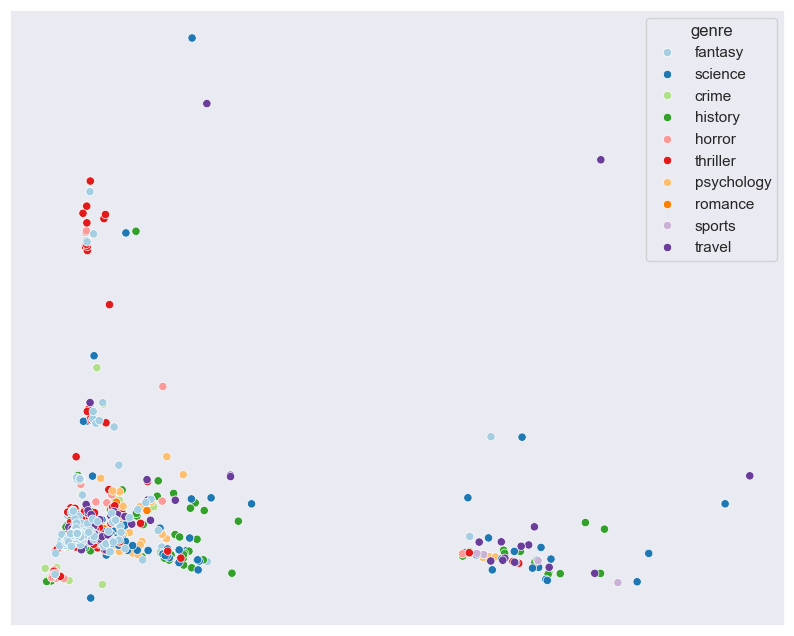

In [30]:
title_count_pca = PCA(n_components=2).fit_transform(title_count_csr)
get_scatter_plot(title_count_pca, hue=books_new.genre);

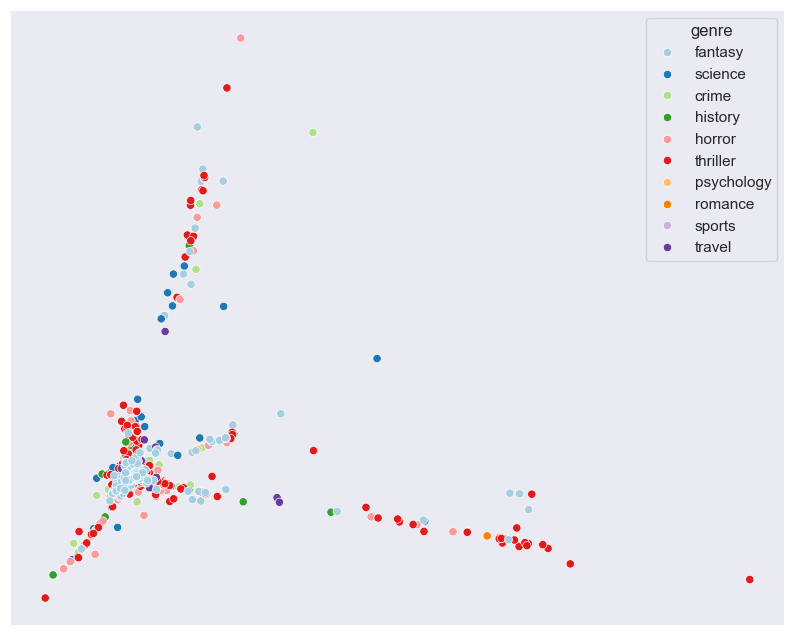

In [31]:
title_tfidf_pca = PCA(n_components=2).fit_transform(title_tfidf_csr)
get_scatter_plot(title_tfidf_pca, hue=books_new.genre);

# Кластеризация книг по названиям

## Разбиение на основе частоты встречаемости слов

In [32]:
kmeans_title_count = KMeans(n_clusters=10, random_state=2)

y_kmeans_title_count = kmeans_title_count.fit_predict(title_count_csr)

books_title_count_clust = books.copy()
books_title_count_clust["cluster"] = y_kmeans_title_count

pd.DataFrame({
    "count": pd.Series(y_kmeans_title_count).value_counts().sort_index(),
    "proportion": pd.Series(y_kmeans_title_count).value_counts(normalize=True).sort_index()
})

,count,proportion
0,15,0.003233
1,4371,0.942026
2,1,0.000216
3,60,0.012931
4,45,0.009698
5,12,0.002586
6,42,0.009052
7,13,0.002802
8,53,0.011422
9,28,0.006034


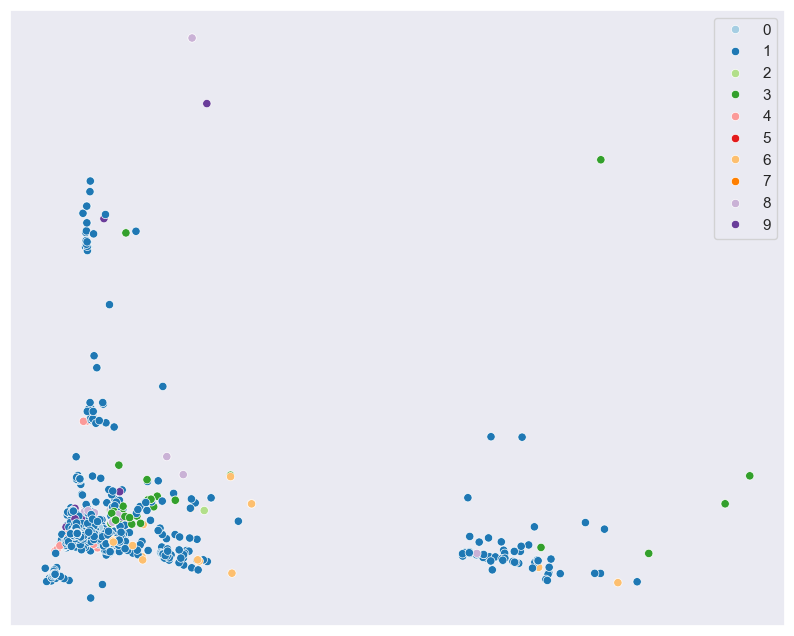

In [33]:
get_scatter_plot(title_count_pca, hue=y_kmeans_title_count);

In [34]:
def get_genre_counts_by_cluster(df):
    crosstab = pd.crosstab(df.genre, df.cluster)

    crosstab["total"] = crosstab.sum(axis=1)
    crosstab.sort_values(by="total", ascending=False, inplace=True)
    crosstab.drop(columns="total", inplace=True)

    clusters = sorted(df.cluster.unique())
    crosstab = crosstab[clusters]
    crosstab.columns.name = None
    crosstab.reset_index(inplace=True)
    
    crosstab.rename(columns={"genre": "Жанр"}, inplace=True)
    crosstab.rename(columns={cluster: f"Кластер {cluster}" for cluster in clusters}, inplace=True)

    return crosstab

In [35]:
get_genre_counts_by_cluster(books_title_count_clust)

,Жанр,Кластер 0,Кластер 1,Кластер 2,Кластер 3,Кластер 4,Кластер 5,Кластер 6,Кластер 7,Кластер 8,Кластер 9
0,thriller,2,960,0,9,15,2,3,7,14,11
1,fantasy,2,826,0,20,6,2,10,2,7,1
2,science,0,604,0,10,7,2,20,0,4,0
3,horror,10,575,0,1,3,1,1,2,6,1
4,history,0,566,1,4,7,3,4,2,8,4
5,crime,0,479,0,3,4,2,1,0,7,4
6,romance,1,106,0,3,1,0,0,0,0,0
7,psychology,0,90,0,1,1,0,0,0,3,5
8,travel,0,84,0,9,1,0,2,0,3,1
9,sports,0,81,0,0,0,0,1,0,1,1


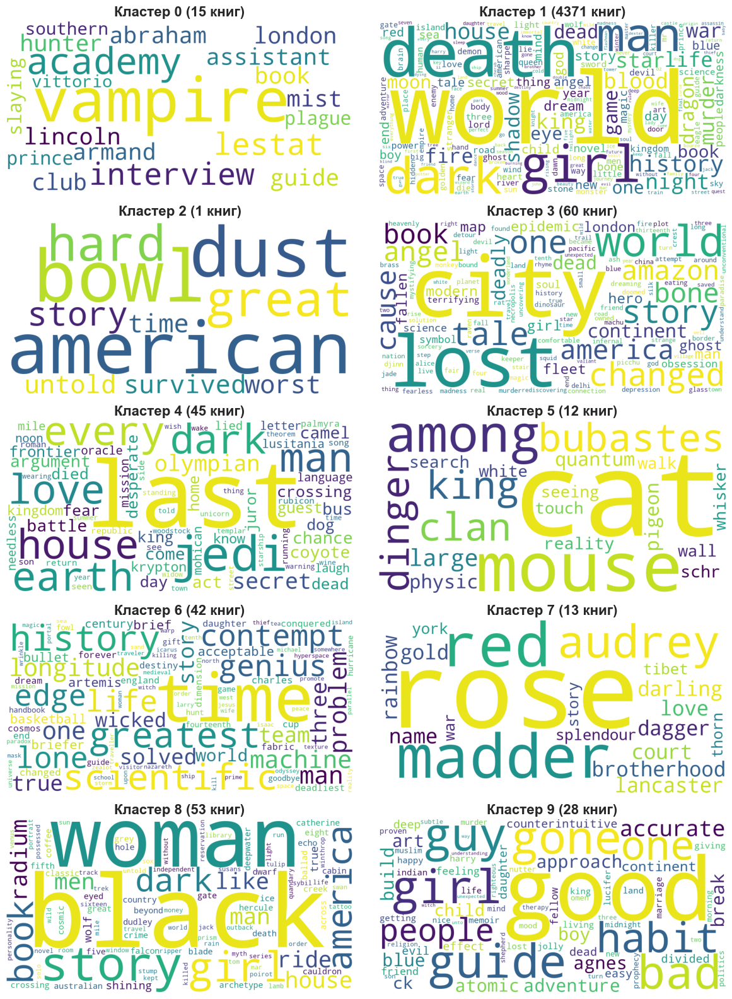

In [36]:
title_count_by_clust = get_words_freq_by_column(
    df=books_title_count_clust,
    column="cluster",
    csr=title_count_csr,
    feature_names=title_count_vec.get_feature_names_out()
)
get_wordclouds_by_column(
    df=books_title_count_clust,
    column="cluster",
    words_freq_by_column=title_count_by_clust,
    title_template="Кластер {value} ({value_cnt} книг)",
    sort_index=True
)

## Разбиение на основе меры TF-IDF

In [37]:
kmeans_title_tfidf = KMeans(n_clusters=10, random_state=0)

y_kmeans_title_tfidf = kmeans_title_tfidf.fit_predict(title_tfidf_csr)

books_title_tfidf_clust = books.copy()
books_title_tfidf_clust["cluster"] = y_kmeans_title_tfidf

pd.DataFrame({
    "count": pd.Series(y_kmeans_title_tfidf).value_counts().sort_index(),
    "proportion": pd.Series(y_kmeans_title_tfidf).value_counts(normalize=True).sort_index()
})

,count,proportion
0,26,0.005603
1,36,0.007759
2,56,0.012069
3,12,0.002586
4,34,0.007328
5,55,0.011853
6,4345,0.936422
7,39,0.008405
8,18,0.003879
9,19,0.004095


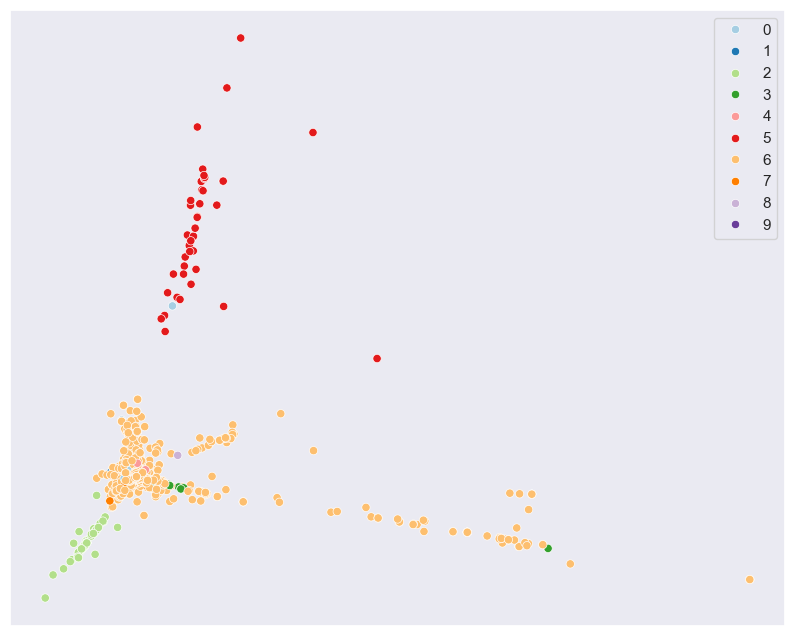

In [38]:
get_scatter_plot(title_tfidf_pca, hue=y_kmeans_title_tfidf);

In [39]:
get_genre_counts_by_cluster(books_title_tfidf_clust)

,Жанр,Кластер 0,Кластер 1,Кластер 2,Кластер 3,Кластер 4,Кластер 5,Кластер 6,Кластер 7,Кластер 8,Кластер 9
0,thriller,4,12,13,6,4,15,957,3,6,3
1,fantasy,7,6,2,0,8,12,825,14,0,2
2,science,7,2,4,0,6,7,617,0,3,1
3,horror,2,6,7,2,2,11,555,12,3,0
4,history,4,2,4,0,5,4,569,5,0,6
5,crime,0,6,25,2,1,5,457,4,0,0
6,romance,1,1,0,1,1,0,107,0,0,0
7,psychology,0,0,1,0,7,0,91,0,0,1
8,travel,1,0,0,1,0,1,88,1,2,6
9,sports,0,1,0,0,0,0,79,0,4,0


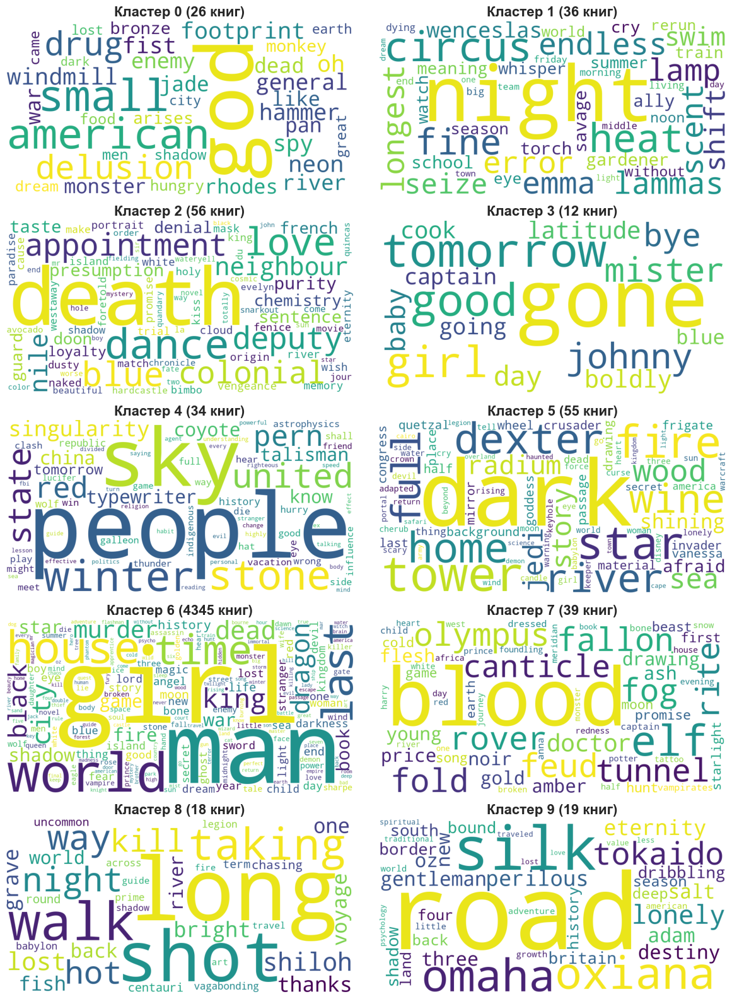

In [40]:
title_tfidf_by_clust = get_words_freq_by_column(
    df=books_title_tfidf_clust,
    column="cluster",
    csr=title_tfidf_csr,
    feature_names=title_tfidf_vec.get_feature_names_out()
)
get_wordclouds_by_column(
    df=books_title_tfidf_clust,
    column="cluster",
    words_freq_by_column=title_tfidf_by_clust,
    title_template="Кластер {value} ({value_cnt} книг)",
    sort_index=True
)

# Векторизация кратких содержаний книг

## Создание мешков слов

In [41]:
summary_count_vec = CountVectorizer(ngram_range=(1, 2), max_df=1000, min_df=20)
summary_count_csr = summary_count_vec.fit_transform(books_new.summary)
(summary_counts := pd.Series(
    summary_count_csr.sum(axis=0).A1.tolist(),
    summary_count_vec.get_feature_names_out()
).sort_values(ascending=False))

father            1946
tell              1882
house             1751
family            1714
get               1695
                  ... 
announcing          20
disappointment      20
settling            20
attempt find        20
accepting           20
Length: 5537, dtype: int64

In [42]:
summary_tfidf_vec = TfidfVectorizer(ngram_range=(1, 2), max_df=1000, min_df=10)
summary_tfidf_csr = summary_tfidf_vec.fit_transform(books_new.summary)
(summary_tfidfs := pd.Series(
    summary_tfidf_csr.sum(axis=0).A1.tolist(),
    summary_tfidf_vec.get_feature_names_out()
).sort_values(ascending=False))

family             54.752956
war                52.045496
father             51.173360
woman              49.767947
human              48.607930
                     ...    
unconsciousness     0.375027
find three          0.371108
delirious           0.360770
manages find        0.351858
three time          0.312758
Length: 10328, dtype: float64

## Облака слов на основе мешков слов

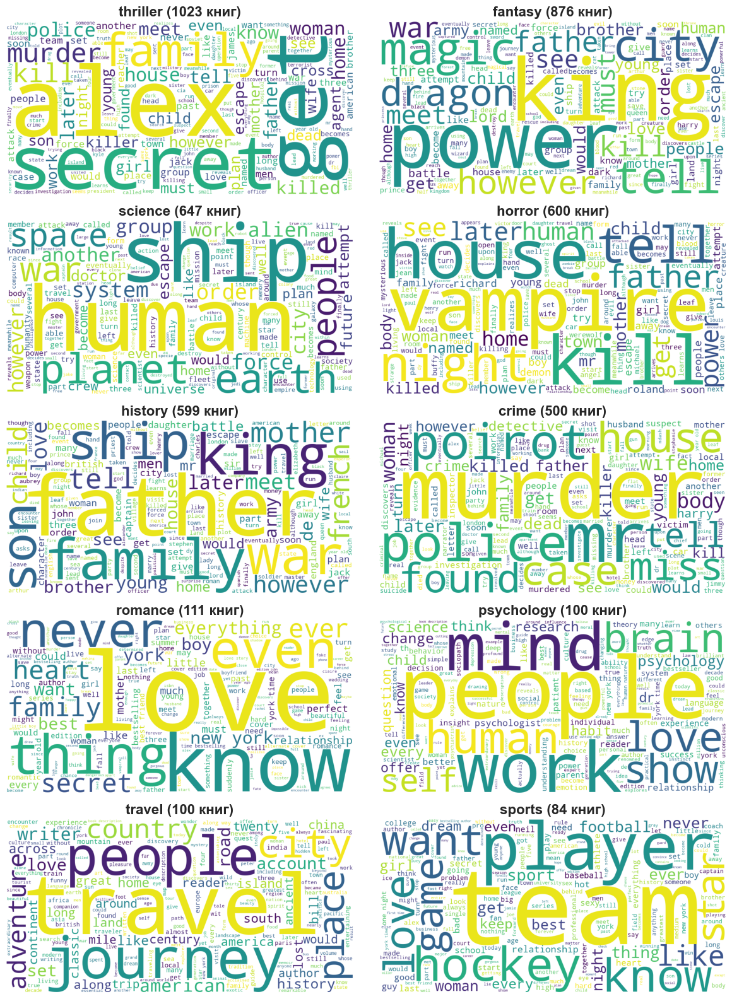

In [43]:
summary_count_by_genre = get_words_freq_by_column(
    df=books_new,
    column="genre",
    csr=summary_count_csr,
    feature_names=summary_count_vec.get_feature_names_out()
)
get_wordclouds_by_column(
    df=books_new,
    column="genre",
    words_freq_by_column=summary_count_by_genre,
    title_template=genre_title_template
)

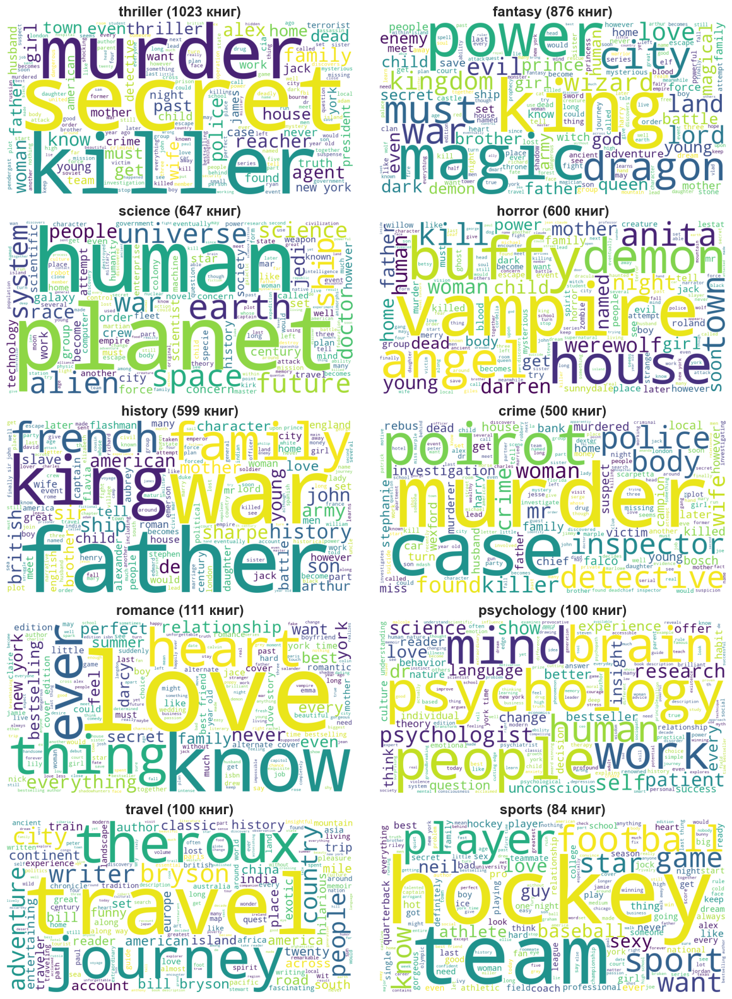

In [44]:
summary_tfidf_by_genre = get_words_freq_by_column(
    df=books_new,
    column="genre",
    csr=summary_tfidf_csr,
    feature_names=summary_tfidf_vec.get_feature_names_out()
)
get_wordclouds_by_column(
    df=books_new,
    column="genre",
    words_freq_by_column=summary_tfidf_by_genre,
    title_template=genre_title_template
)

## Визуализация распределения книг на плоскости

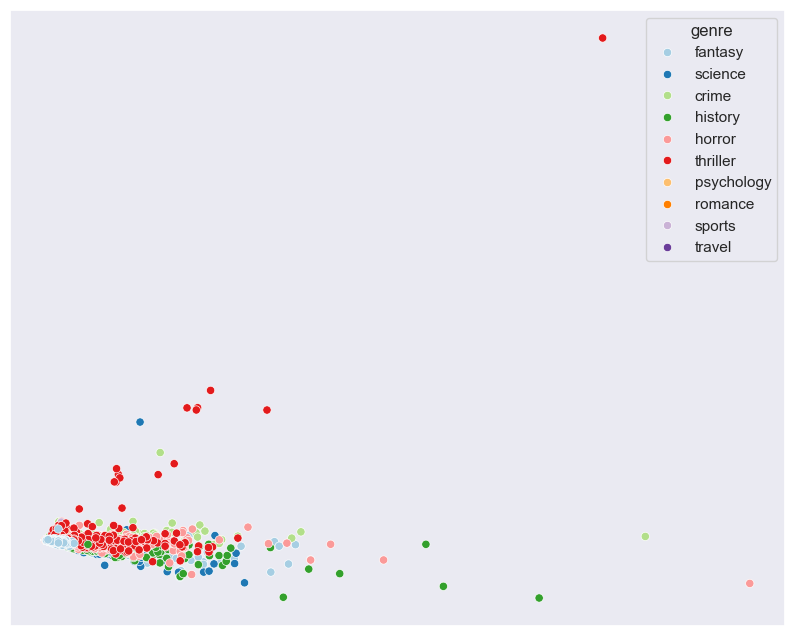

In [45]:
summary_count_pca = PCA(n_components=2).fit_transform(summary_count_csr)
get_scatter_plot(summary_count_pca, hue=books_new.genre);

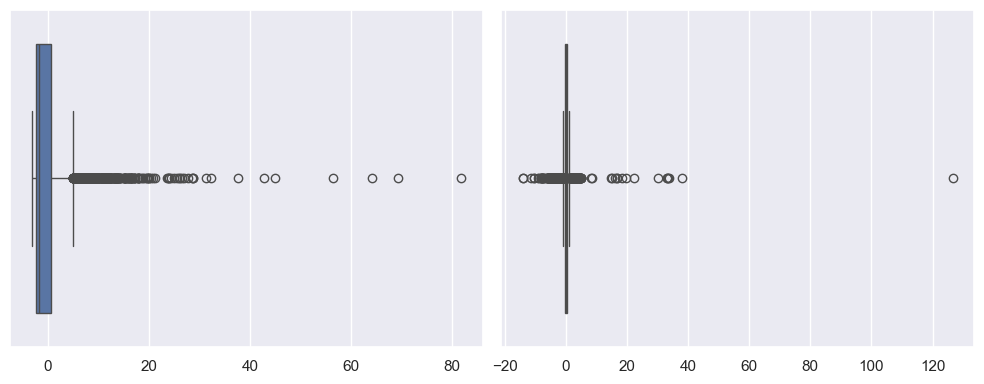

In [46]:
_, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
sns.boxplot(x=summary_count_pca[:, 0], ax=ax[0])
sns.boxplot(x=summary_count_pca[:, 1], ax=ax[1])
plt.tight_layout();

In [47]:
summary_count_pca_df = pd.DataFrame(summary_count_pca, columns=["x", "y"])
summary_count_pca_mask = (summary_count_pca_df.x > 30) | (summary_count_pca_df.y > 20)
books[summary_count_pca_mask]

,title,summary,genre
986,A Clockwork Orange,"Alex, a teenager living in near-future Englan...",science
1277,The Scapegoat,"'I left the car by the side of the cathedral,...",crime
1282,Little Boy Blue,Alex Hammond is an 11 year old boy living in ...,crime
1522,The Master of Ballantrae,The novel is presented as the memoir of one E...,history
1634,The King Must Die,"The story is told by Theseus, looking back on...",history
1871,The Wake of the Lorelei Lee,"In the previous book, Rapture of the Deep, Ja...",history
1890,Come Rack! Come Rope!,"Robin Audrey and Marjorie Manners, both aged ...",history
2054,El Príncipe de la Niebla,"Max Carver, son of a watchmaker, has moved wi...",horror
2162,The Killing Dance,"The Killing Dance takes place in May, about a...",horror
2201,The Lunatic Cafe,The Lunatic Cafe occurs shortly after the eve...,horror


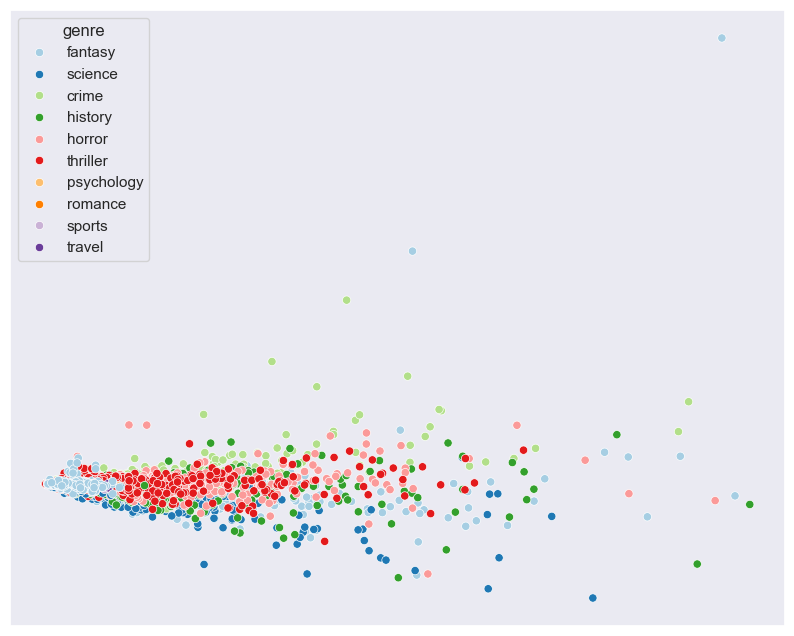

In [48]:
summary_count_csr_new = summary_count_csr[~summary_count_pca_mask.values, :]
summary_count_pca_new = PCA(n_components=2).fit_transform(summary_count_csr_new)
get_scatter_plot(summary_count_pca_new, hue=books_new[~summary_count_pca_mask].genre);

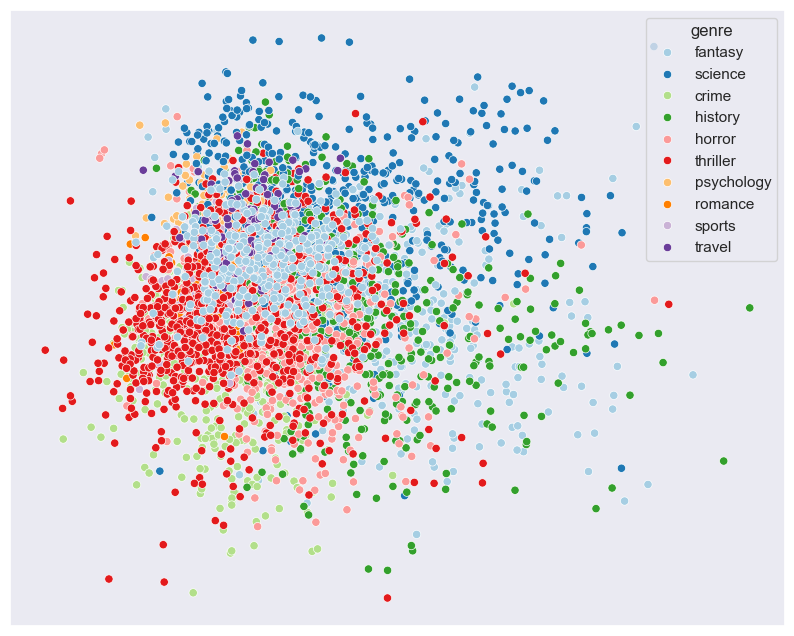

In [49]:
summary_tfidf_pca = PCA(n_components=2).fit_transform(summary_tfidf_csr)
get_scatter_plot(summary_tfidf_pca, hue=books_new.genre);

# Кластеризация книг по кратким содержаниям

## Разбиение на основе частоты встречаемости слов

In [50]:
kmeans_summary_count = KMeans(n_clusters=10, random_state=1)

y_kmeans_summary_count = kmeans_summary_count.fit_predict(summary_count_csr_new)

books_summary_count_clust = books[~summary_count_pca_mask].copy().reset_index()
books_summary_count_clust["cluster"] = y_kmeans_summary_count

pd.DataFrame({
    "count": pd.Series(y_kmeans_summary_count).value_counts().sort_index(),
    "proportion": pd.Series(y_kmeans_summary_count).value_counts(normalize=True).sort_index()
})

,count,proportion
0,55,0.011894
1,4,0.000865
2,1,0.000216
3,133,0.028763
4,1,0.000216
5,99,0.021410
6,747,0.161548
7,41,0.008867
8,3542,0.766003
9,1,0.000216


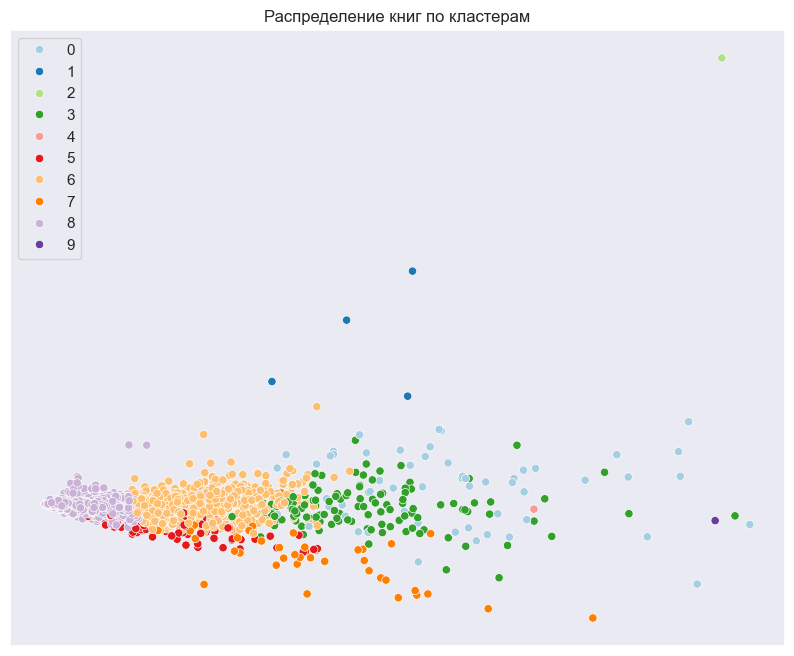

In [51]:
get_scatter_plot(summary_count_pca_new, hue=y_kmeans_summary_count, title="Распределение книг по кластерам");

In [52]:
get_genre_counts_by_cluster(books_summary_count_clust)

,Жанр,Кластер 0,Кластер 1,Кластер 2,Кластер 3,Кластер 4,Кластер 5,Кластер 6,Кластер 7,Кластер 8,Кластер 9
0,thriller,4,0,0,21,0,4,121,4,863,0
1,fantasy,10,1,1,46,0,13,150,3,652,0
2,science,2,0,0,8,0,75,75,15,471,0
3,horror,5,0,0,38,0,7,153,2,391,1
4,history,17,0,0,15,1,0,143,15,404,0
5,crime,17,3,0,5,0,0,105,2,366,0
6,romance,0,0,0,0,0,0,0,0,111,0
7,psychology,0,0,0,0,0,0,0,0,100,0
8,travel,0,0,0,0,0,0,0,0,100,0
9,sports,0,0,0,0,0,0,0,0,84,0


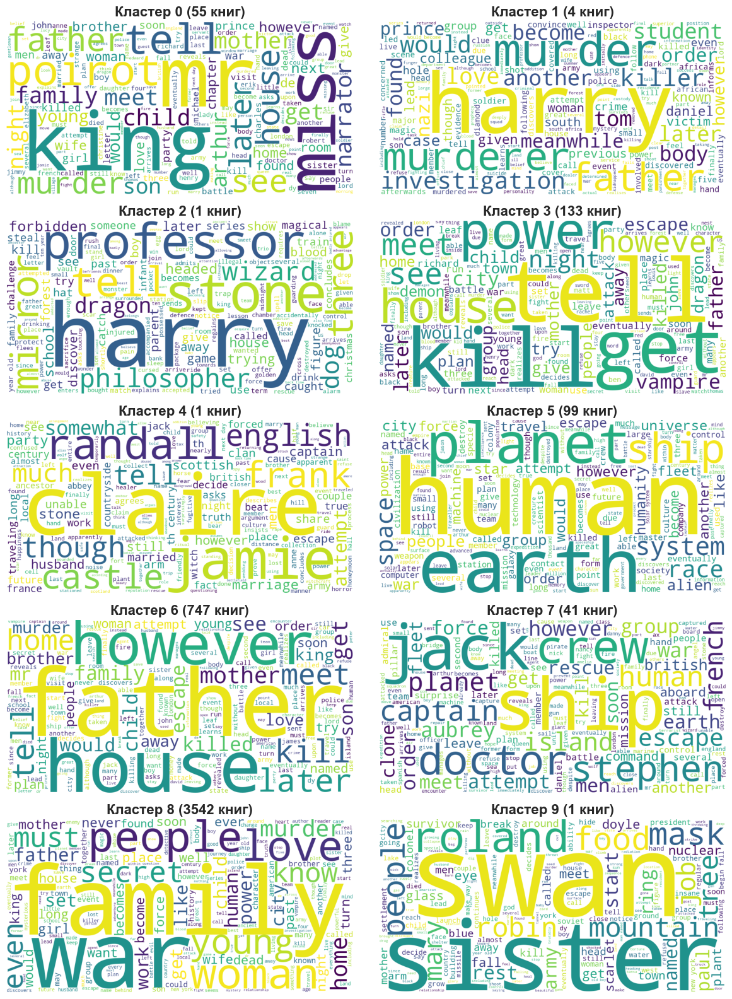

In [53]:
summary_count_by_clust = get_words_freq_by_column(
    df=books_summary_count_clust,
    column="cluster",
    csr=summary_count_csr_new,
    feature_names=summary_count_vec.get_feature_names_out()
)
get_wordclouds_by_column(
    df=books_summary_count_clust,
    column="cluster",
    words_freq_by_column=summary_count_by_clust,
    title_template="Кластер {value} ({value_cnt} книг)",
    sort_index=True
)

## Разбиение на основе меры TF-IDF

In [54]:
kmeans_summary_tfidf = KMeans(n_clusters=10, random_state=0)

y_kmeans_summary_tfidf = kmeans_summary_tfidf.fit_predict(summary_tfidf_csr)

books_summary_tfidf_clust = books.copy()
books_summary_tfidf_clust["cluster"] = y_kmeans_summary_tfidf

pd.DataFrame({
    "count": pd.Series(y_kmeans_summary_tfidf).value_counts().sort_index(),
    "proportion": pd.Series(y_kmeans_summary_tfidf).value_counts(normalize=True).sort_index()
})

,count,proportion
0,653,0.140733
1,219,0.047198
2,940,0.202586
3,887,0.191164
4,91,0.019612
5,575,0.123922
6,557,0.120043
7,471,0.101509
8,110,0.023707
9,137,0.029526


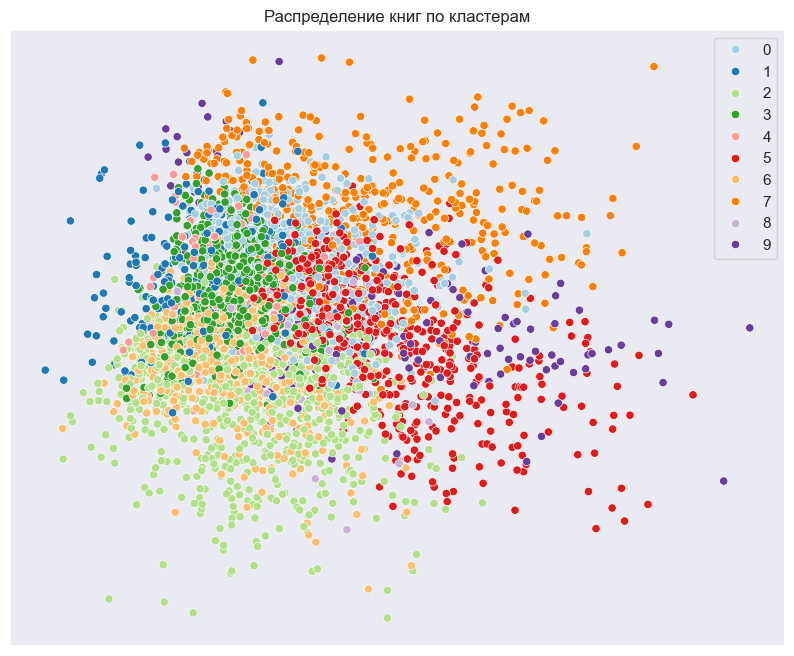

In [55]:
get_scatter_plot(summary_tfidf_pca, hue=y_kmeans_summary_tfidf, title="Распределение книг по кластерам");

In [56]:
get_genre_counts_by_cluster(books_summary_tfidf_clust)

,Жанр,Кластер 0,Кластер 1,Кластер 2,Кластер 3,Кластер 4,Кластер 5,Кластер 6,Кластер 7,Кластер 8,Кластер 9
0,thriller,214,67,265,200,20,11,213,22,5,6
1,fantasy,38,56,49,178,34,389,72,44,7,9
2,science,95,6,46,80,10,15,24,352,4,15
3,horror,25,24,175,94,1,35,100,22,85,39
4,history,196,12,61,40,2,122,81,14,5,66
5,crime,29,6,339,75,0,3,44,1,1,2
6,romance,1,22,3,58,13,0,13,0,1,0
7,psychology,3,12,0,66,4,0,1,13,1,0
8,travel,48,5,0,37,3,0,4,2,1,0
9,sports,4,9,2,59,4,0,5,1,0,0


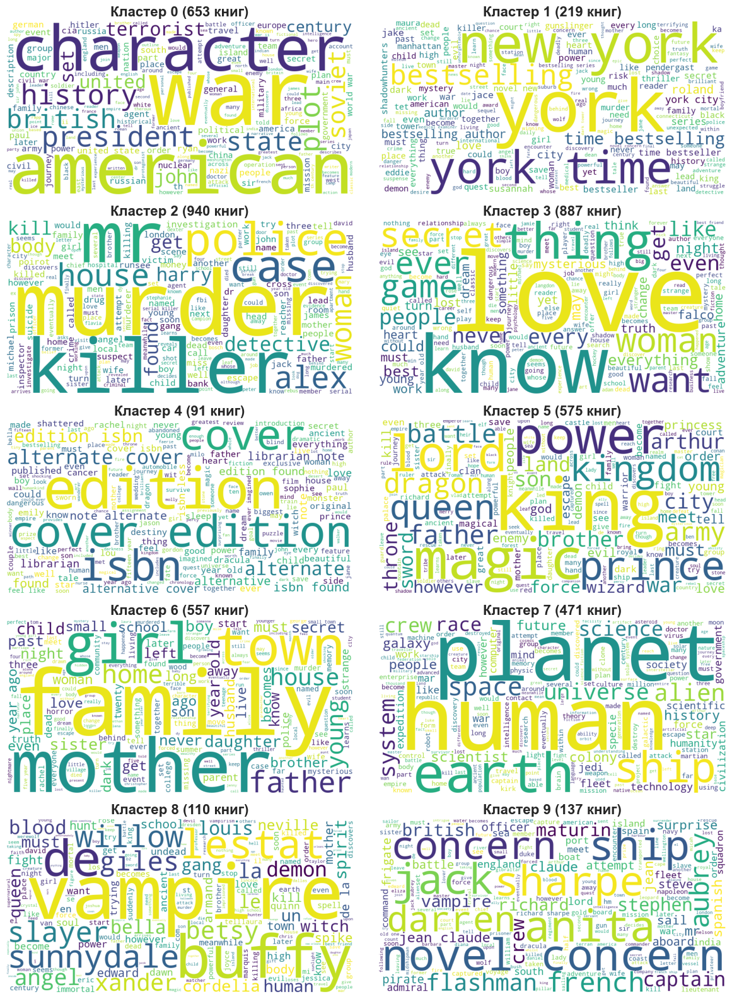

In [57]:
summary_tfidf_by_clust = get_words_freq_by_column(
    df=books_summary_tfidf_clust,
    column="cluster",
    csr=summary_tfidf_csr,
    feature_names=summary_tfidf_vec.get_feature_names_out()
)
get_wordclouds_by_column(
    df=books_summary_tfidf_clust,
    column="cluster",
    words_freq_by_column=summary_tfidf_by_clust,
    title_template="Кластер {value} ({value_cnt} книг)",
    sort_index=True
)